# STopover_visium sample code

## Load STopover & Prepare

In [1]:
%%time
import os
import sys
sys.path.insert(1, '/home/nmadmin/DATA2/STopover')

CPU times: user 25 µs, sys: 0 ns, total: 25 µs
Wall time: 26.9 µs


In [2]:
import os
import pandas as pd
import numpy as np
import scanpy as sc
import seaborn as sns

In [3]:
from STopover import STopover_visium

### Create STopover_imageST object  
#### (annotate cells & convert to grid-based data)

In [4]:
out_dir = './results/Visium_LUAD'
os.makedirs(out_dir, exist_ok=True)

In [5]:
help(STopover_visium)

Help on class STopover_visium in module STopover.STopover_class:

class STopover_visium(anndata._core.anndata.AnnData)
 |  STopover_visium(sp_adata: anndata._core.anndata.AnnData = None, sp_load_path: str = '.', lognorm: bool = False, min_size: int = 20, fwhm: float = 2.5, thres_per: float = 30, save_path: str = '.', J_count: int = 0)
 |  
 |  ## Class to calculate connected component location and jaccard similarity indices in visium dataset
 |  
 |  ### Input
 |  * sp_adata: Anndata object for Visium spatial transcriptomic data  
 |  * sp_load_path: path to 10X-formatted Visium dataset directory or .h5ad Anndata object  
 |  * lognorm: whether to lognormalize (total count normalize and log transform) the count matrix saved in adata.X  
 |  * min_size: minimum size of a connected component  
 |  * fwhm: full width half maximum value for the gaussian smoothing kernel as the multiple of the central distance between the adjacent spots  
 |  * thres_per: lower percentile value threshold to

In [6]:
data_path = './data/Visium_LUAD/spa18ca02'

### Read single-cell dataset (GSE131907) with cell type annotation in .obs as 'Cell_subtype'

##### Cells with 'Sample_Origin = tLung' were subsetted for analysis¶

In [7]:
sc_adata = sc.read_h5ad('./data/sc_lung_cancer.h5ad')

In [8]:
sc_adata = sc_adata[sc_adata.obs['Sample_Origin']=='tLung']

In [9]:
sc_adata

View of AnnData object with n_obs × n_vars = 45149 × 29634
    obs: 'Barcode', 'Sample', 'Sample_Origin', 'Cell_type', 'Cell_type.refined', 'Cell_subtype'

##### Reassign Undetermined and NaN in 'Cell_subtype' into _ns subtype

In [10]:
sc_adata.obs['Cell_subtype'] = sc_adata.obs['Cell_subtype'].astype(object)
sc_adata.obs['Cell_type'] = sc_adata.obs['Cell_type'].astype(object)

sc_adata.obs['Cell_subtype'] = sc_adata.obs['Cell_subtype'].where(sc_adata.obs['Cell_subtype'].ne('Undetermined'), sc_adata.obs['Cell_type']+'_ns')
sc_adata.obs['Cell_subtype'] = sc_adata.obs['Cell_subtype'].fillna(sc_adata.obs['Cell_type']+'_ns')

In [11]:
sc_adata.obs

,Barcode,Sample,Sample_Origin,Cell_type,Cell_type.refined,Cell_subtype
AAACCTGAGACGACGT_LUNG_T09,AAACCTGAGACGACGT,LUNG_T09,tLung,Myeloid cells,Myeloid cells,CD1c+ DCs
AAACCTGAGACGACGT_LUNG_T34,AAACCTGAGACGACGT,LUNG_T34,tLung,B lymphocytes,B lymphocytes,Follicular B cells
AAACCTGAGACGCTTT_LUNG_T18,AAACCTGAGACGCTTT,LUNG_T18,tLung,Epithelial cells,Epithelial cells,tS2
AAACCTGAGACTGTAA_LUNG_T34,AAACCTGAGACTGTAA,LUNG_T34,tLung,Epithelial cells,Epithelial cells,tS2
AAACCTGAGATATGCA_LUNG_T25,AAACCTGAGATATGCA,LUNG_T25,tLung,T lymphocytes,T/NK cells,CD4+ Th
...,...,...,...,...,...,...
TTTGTCATCTCACATT_LUNG_T31,TTTGTCATCTCACATT,LUNG_T31,tLung,T lymphocytes,T/NK cells,CD8+/CD4+ Mixed Th
TTTGTCATCTGCGACG_LUNG_T31,TTTGTCATCTGCGACG,LUNG_T31,tLung,Fibroblasts,NaN,Fibroblasts_ns
TTTGTCATCTTGCCGT_LUNG_T30,TTTGTCATCTTGCCGT,LUNG_T30,tLung,Epithelial cells,Epithelial cells,tS1
TTTGTCATCTTTACAC_LUNG_T25,TTTGTCATCTTTACAC,LUNG_T25,tLung,B lymphocytes,B lymphocytes,Follicular B cells


### Read 10X-formatted Visium dataset

In [12]:
sp_adata = sc.read_visium(data_path)

In [13]:
sp_adata.var_names_make_unique()

### Run CellDART for cell type deconvolution

#### Installation of CellDART

In [15]:
import sys
!{sys.executable} -m pip install git+https://github.com/mexchy1000/CellDART.git

  Cloning https://github.com/mexchy1000/CellDART.git to /tmp/pip-req-build-r8uzqitu
  Running command git clone --filter=blob:none --quiet https://github.com/mexchy1000/CellDART.git /tmp/pip-req-build-r8uzqitu
  Resolved https://github.com/mexchy1000/CellDART.git to commit 3922083e3c5df9dfb59ca0d39ed45641deb300db
  Preparing metadata (setup.py) ... done


#### Run CellDART

In [14]:
from CellDART.pred_cellf_celldart import pred_cellf_celldart

celltype='Cell_subtype'

spatial_final = pred_cellf_celldart(adata_sp=sp_adata, adata_sc=sc_adata, count_from_raw = False,
                                    gpu=True, celltype=celltype, num_markers=20,
                                    nmix=10, npseudo=5*sp_adata.shape[0],
                                    alpha=1, alpha_lr=5, batch_size=512,  
                                    emb_dim=64, n_iterations=3000, init_train_epoch=10,  
                                    outdir=os.path.join(out_dir, 'CellDART_output'), return_anndata=True)

GPU is available and will be used


2024-09-21 20:40:58.870943: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/nmadmin/anaconda3/envs/STopover/lib/python3.8/site-packages/cv2/../../lib64:
2024-09-21 20:40:58.870968: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


Shape of the provided spatial data is (1917, 36601)
Shape of the provided single-cell data is (45149, 29634)
Total number of marker genes:  457
Size of spatial, single-cell, pseudospot, and cell fraction data: (1917, 457) (45149, 457) (9585, 457) (9585, 47)
Train on 9585 samples
Epoch 1/10
9585/9585 [==============================] - 0s 27us/sample - loss: 1.5031 - mae: 0.0283
Epoch 2/10
9585/9585 [==============================] - 0s 14us/sample - loss: 1.1230 - mae: 0.0240
Epoch 3/10
9585/9585 [==============================] - 0s 14us/sample - loss: 0.9559 - mae: 0.0217
Epoch 4/10
9585/9585 [==============================] - 0s 14us/sample - loss: 0.8276 - mae: 0.0199
Epoch 5/10
9585/9585 [==============================] - 0s 14us/sample - loss: 0.7301 - mae: 0.0184
Epoch 6/10
9585/9585 [==============================] - 0s 15us/sample - loss: 0.6571 - mae: 0.0172
Epoch 7/10
9585/9585 [==============================] - 0s 15us/sample - loss: 0.6035 - mae: 0.0163
Epoch 8/10
9585/9585

In [15]:
spatial_final.obs

,in_tissue,array_row,array_col,Plasma cells_cellf,Endothelial cells_ns_cellf,Fibroblasts_ns_cellf,NK cells_ns_cellf,EPCs_cellf,Exhausted Tfh_cellf,Mesothelial cells_cellf,...,COL13A1+ matrix FBs_cellf,MAST_cellf,Stalk-like ECs_cellf,Follicular B cells_cellf,tS3_cellf,Treg_cellf,Myeloid cells_ns_cellf,CD4+ Th_cellf,CD8 low T_cellf,Pericytes_cellf
AAACAGCTTTCAGAAG-1,1,43,9,0.000703,0.000004,0.000016,0.000028,0.000002,0.000020,8.430452e-08,...,0.000152,0.034291,0.000001,0.028175,0.000005,0.001946,0.016940,0.024352,0.000131,0.000004
AAACAGGGTCTATATT-1,1,47,13,0.000992,0.000005,0.000044,0.000045,0.000003,0.000221,2.536357e-07,...,0.000318,0.023143,0.000002,0.024308,0.000022,0.003970,0.004039,0.071716,0.000148,0.000005
AAACCGGGTAGGTACC-1,1,42,28,0.000481,0.000002,0.000020,0.000013,0.000001,0.000116,1.848101e-07,...,0.000088,0.024890,0.000002,0.014226,0.000008,0.000881,0.004843,0.027263,0.000060,0.000004
AAACCGTTCGTCCAGG-1,1,52,42,0.019464,0.000059,0.000114,0.000034,0.000010,0.000033,2.419187e-06,...,0.002780,0.074692,0.000038,0.000462,0.000002,0.006836,0.016215,0.003407,0.000748,0.000116
AAACCTCATGAAGTTG-1,1,37,19,0.000280,0.000003,0.000022,0.000047,0.000002,0.000140,1.972689e-07,...,0.000049,0.026030,0.000001,0.050729,0.000028,0.001113,0.006944,0.054091,0.000076,0.000004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1,1,24,64,0.184688,0.000027,0.000284,0.000098,0.000004,0.000060,4.519889e-06,...,0.003983,0.016427,0.000021,0.005488,0.000002,0.002225,0.116330,0.003671,0.001845,0.000026
TTGTTGTGTGTCAAGA-1,1,31,77,0.023005,0.000050,0.001289,0.000041,0.000013,0.000244,1.556327e-05,...,0.000689,0.014906,0.000012,0.004874,0.000013,0.003848,0.769331,0.005806,0.002107,0.000615
TTGTTTCACATCCAGG-1,1,58,42,0.037756,0.000035,0.000125,0.000026,0.000014,0.000007,5.332687e-07,...,0.001002,0.062682,0.000038,0.002043,0.000003,0.000923,0.020981,0.007721,0.000386,0.000038
TTGTTTCATTAGTCTA-1,1,60,30,0.003851,0.000006,0.000080,0.000017,0.000005,0.000072,1.993688e-06,...,0.001403,0.049853,0.000004,0.001417,0.000006,0.002085,0.007229,0.012858,0.000804,0.000043


#### Remove _cellf in the end of column names

In [16]:
spatial_final.obs.columns = [i[:-6] if i.endswith('_cellf') else i for i in spatial_final.obs.columns]

#### Save anndata

In [17]:
spatial_final.write_h5ad(os.path.join(out_dir, 'CellDART_output', 'spatial_final_deconv.h5ad'))

## Topological similarity analysis

#### Load anndata

In [8]:
spatial_final = sc.read_h5ad(os.path.join(out_dir, 'CellDART_output', 'spatial_final_deconv.h5ad'))

In [9]:
cell_types = spatial_final.obs.columns[3:-1]
cell_types

Index(['Plasma cells', 'Endothelial cells_ns', 'Fibroblasts_ns', 'NK cells_ns',
       'EPCs', 'Exhausted Tfh', 'Mesothelial cells', 'tS2', 'Tip-like ECs',
       'Activated DCs', 'GC B cells in the DZ', 'Alveolar Mac',
       'T lymphocytes_ns', 'Epithelial cells_ns', 'Tumor ECs', 'Naive CD4+ T',
       'COL14A1+ matrix FBs', 'tS1', 'Smooth muscle cells', 'Pleural Mac',
       'pDCs', 'CD141+ DCs', 'Naive CD8+ T', 'CD207+CD1a+ LCs', 'MALT B cells',
       'CD8+/CD4+ Mixed Th', 'Lymphatic ECs', 'B lymphocytes_ns',
       'Exhausted CD8+ T', 'CD1c+ DCs', 'Cytotoxic CD8+ T', 'Monocytes',
       'CD163+CD14+ DCs', 'Myofibroblasts', 'NK', 'GC B cells in the LZ',
       'mo-Mac', 'COL13A1+ matrix FBs', 'MAST', 'Stalk-like ECs',
       'Follicular B cells', 'tS3', 'Treg', 'Myeloid cells_ns', 'CD4+ Th',
       'CD8 low T'],
      dtype='object')

#### Create list of cell type pairs

In [10]:
cell_pairs = pd.DataFrame([(j,k) for i,j in enumerate(cell_types) for k in cell_types[i+1:]])
cell_pairs

,0,1
0,Plasma cells,Endothelial cells_ns
1,Plasma cells,Fibroblasts_ns
2,Plasma cells,NK cells_ns
3,Plasma cells,EPCs
4,Plasma cells,Exhausted Tfh
...,...,...
1030,Treg,CD4+ Th
1031,Treg,CD8 low T
1032,Myeloid cells_ns,CD4+ Th
1033,Myeloid cells_ns,CD8 low T


### 1. Extract colocalized regions between cell types

#### Extract colocalization patterns btw cell types

In [11]:
spatial_final_mod = STopover_visium(sp_adata=spatial_final, lognorm=True,
                                    min_size=20, fwhm=2.5, thres_per=30, 
                                    save_path=out_dir)
    
spatial_final_mod.topological_similarity(feat_pairs=cell_pairs, jaccard_type="default", J_result_name='result')

End of data preparation
Elapsed time: 0.04 seconds 
Calculation of adjacency matrix and mask


  0%|          | 0/1 [00:00<?, ?it/s]

Calculation of connected components for each feature


  0%|          | 0/46 [00:00<?, ?it/s]

Calculation of composite jaccard indexes between feature pairs


  0%|          | 0/1035 [00:00<?, ?it/s]

End of the whole process: 7.09 seconds


#### Extract dataframe for jaccard similarity index (J_comp)

In [12]:
df_mod = spatial_final_mod.uns['J_result_0']
df_mod['min_size'], df_mod['fwhm'], df_mod['percent'] = 20, 2.5, 30

#### Save the dataframe for J_comp

In [13]:
df_mod.to_csv(os.path.join(out_dir, 'jaccard_composite_celltype.csv'), sep = ',', header=True, index=False)

#### Load topology result and visualize top interacting cell types (for percentage)

In [14]:
df = pd.read_csv(os.path.join(out_dir, 'jaccard_composite_celltype.csv'))

In [15]:
df

,group,Feat_1,Feat_2,Avg_1,Avg_2,J_comp,min_size,fwhm,percent
0,0,Plasma cells,Endothelial cells_ns,0.012555,0.000056,0.176370,20,2.5,30
1,0,Plasma cells,Fibroblasts_ns,0.012555,0.000223,0.305466,20,2.5,30
2,0,Plasma cells,NK cells_ns,0.012555,0.000038,0.191413,20,2.5,30
3,0,Plasma cells,EPCs,0.012555,0.000018,0.300000,20,2.5,30
4,0,Plasma cells,Exhausted Tfh,0.012555,0.000113,0.120150,20,2.5,30
...,...,...,...,...,...,...,...,...,...
1030,0,Treg,CD4+ Th,0.003089,0.025557,0.146018,20,2.5,30
1031,0,Treg,CD8 low T,0.003089,0.000922,0.304625,20,2.5,30
1032,0,Myeloid cells_ns,CD4+ Th,0.059788,0.025557,0.028465,20,2.5,30
1033,0,Myeloid cells_ns,CD8 low T,0.059788,0.000922,0.271784,20,2.5,30


#### Create barplot for the top overlapping immune cell types

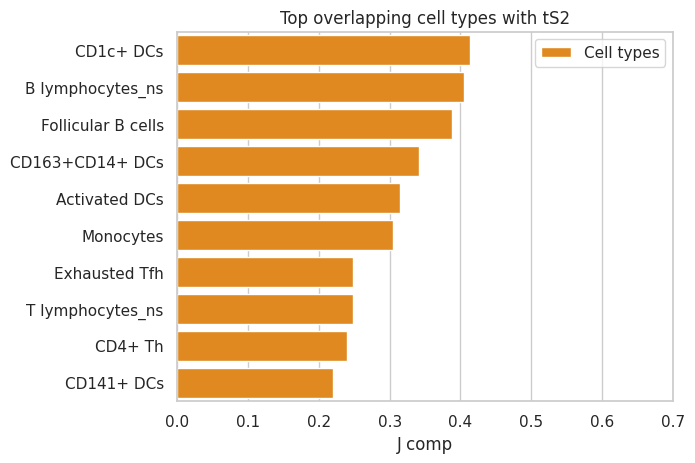

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams.update(plt.rcParamsDefault)
sns.set_theme(style="whitegrid")

min_size = 20
fwhm = 2.5
per = 30
immune_cell_types = ['mo-Mac', 'NK cells_ns','Follicular B cells', 'CD1c+ DCs', 'Activated DCs',
                     'CD141+ DCs', 'Myeloid cells_ns', 'EPCs','CD207+CD1a+ LCs', 'Naive CD4+ T', 
                     'Naive CD8+ T', 'Alveolar Mac', 'Pleural Mac','Exhausted Tfh', 'CD8 low T', 
                     'Monocytes', 'Treg', 'CD163+CD14+ DCs','CD8+/CD4+ Mixed Th', 'GC B cells in the DZ', 
                     'T lymphocytes_ns', 'pDCs', 'NK','CD4+ Th', 'Cytotoxic CD8+ T','GC B cells in the LZ', 
                     'B lymphocytes_ns', 'Exhausted CD8+ T','Plasma cells', 'MALT B cells', 'MAST']

# Initialize the matplotlib figure
df2_1 = df[(df['Feat_1']=='tS2') & (df['percent']==per)].copy()
df2_2 = df[(df['Feat_2']=='tS2') & (df['percent']==per)].copy()
df2_1['Jcomp'] = df2_1['J_comp']; df2_1['Feat'] = df2_1['Feat_2']
df2_2['Jcomp'] = df2_2['J_comp']; df2_2['Feat'] = df2_2['Feat_1']
df3 = pd.concat([df2_1, df2_2], axis=0)
df3 = df3[df3['Feat'].isin(immune_cell_types)].copy()
df3 = df3.sort_values(by='J_comp',ascending=False).head(10)

p = sns.barplot(x="J_comp", y="Feat", data=df3, label="Cell types", color="darkorange")

# Add a legend and informative axis label
p.set_title("Top overlapping cell types with tS2", fontsize=12)
p.set(xlim=(0, 0.7), ylabel="", xlabel="J comp")

plt.savefig(os.path.join(out_dir,'Spatial_lung_Jmmx_tS2_'+str(min_size)+'_'+str(fwhm)+'_'+str(per)+'_total.png'), dpi=200)
plt.show()

#### Visualize spatial map of cell types

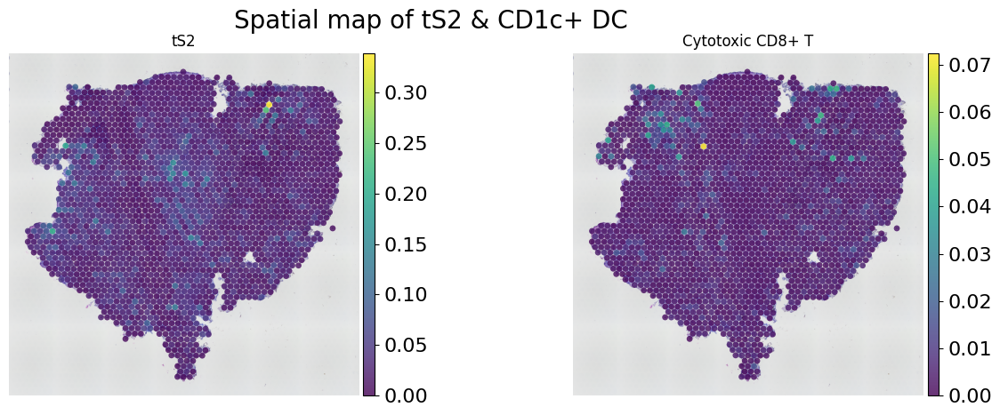

In [17]:
import matplotlib.pyplot as plt
testcells = ['tS2','Cytotoxic CD8+ T']
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams["figure.figsize"] = (15,5)
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams["legend.framealpha"] = 0.2

fig, axs = plt.subplots(1, 2)
  
for visnum in range(len(testcells)):
    sc.pl.spatial(spatial_final, img_key='hires', color=testcells[visnum], vmin=0,
                  palette='Set1', size=1.5, alpha = 0.8, alpha_img = 1,
                  ax = axs[visnum], show = False)
    axs[visnum].set_title(testcells[visnum], fontsize=12)
    axs[visnum].axis('off')

plt.suptitle('Spatial map of tS2 & CD1c+ DC', fontsize=20)
plt.savefig(os.path.join(out_dir,'Spatial_lung_CellDART_tumor_DC.png'), dpi=200)
plt.show()

#### Visualize colocalized regions of a cell type pair

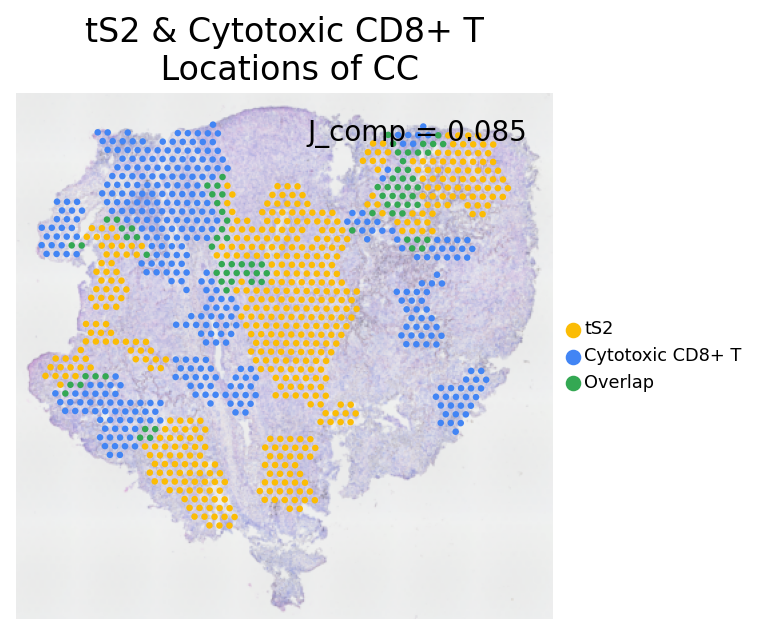

In [18]:
spatial_final_mod.vis_all_connected(spot_size=1, alpha_img=0.6, alpha=1,  
                                    feat_name_x='tS2', feat_name_y='Cytotoxic CD8+ T',  
                                    fig_size=(5,5), 
                                    batch_colname ='batch', batch_name='0', image_res='lowres',  
                                    adjust_image=True, border = 500,  
                                    title_fontsize=15, legend_fontsize=8, title = '\n Locations of CC', 
                                    return_axis=False, save=True, dpi=200)

#### Visualize top 8 regions with high local overlap

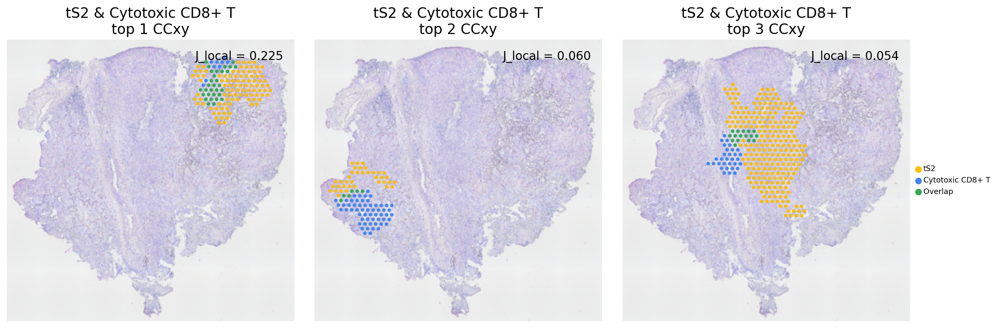

In [19]:
spatial_final_mod.vis_jaccard_top_n_pair(spot_size=1, alpha_img=0.6, alpha=1,  
                                         feat_name_x='tS2', feat_name_y='Cytotoxic CD8+ T',
                                         top_n = 3, ncol = 3,
                                         fig_size=(5,5), 
                                         batch_colname ='batch', batch_name='0', image_res='lowres',  
                                         adjust_image=True, border = 500,  
                                         title_fontsize=15, legend_fontsize=8, title = '', 
                                         return_axis=False, save=True, dpi=200)

#### Run permutation test

In [20]:
help(STopover_visium.run_significance_test)

Help on function run_significance_test in module STopover.STopover_class:

run_significance_test(self, feat_pairs_sig_test=None, nperm=1000, seed=0, jaccard_type='default', num_workers=64, progress_bar=True)
    ## Perform a significant test using a permutation test and calculate p-values
    * feat_pairs_sig_test: feature pairs for the significance test (default: None -> Test all saved in .uns)
    * nperm: number of the random permutation (default: 1000)
    * seed: the seed for the random number generator (default: 0)
    * jaccard_type: type of the jaccard index output ('default': jaccard index or 'weighted': weighted jaccard index)
    * num_workers: number of workers to use for multiprocessing
    * progress_bar: whether to show the progress bar during multiprocessing



In [21]:
df_sub = df_mod[((df_mod['Feat_1']=='tS2') & (df_mod['Feat_2'].isin(['CD1c+ DCs','Follicular B cells','Cytotoxic CD8+ T']))) | \
                ((df_mod['Feat_2']=='tS2') & (df_mod['Feat_1'].isin(['CD1c+ DCs','Follicular B cells','Cytotoxic CD8+ T'])))].reset_index(drop=True)
df_sub

,group,Feat_1,Feat_2,Avg_1,Avg_2,J_comp,min_size,fwhm,percent
0,0,tS2,CD1c+ DCs,0.024011,0.001443,0.413619,20,2.5,30
1,0,tS2,Cytotoxic CD8+ T,0.024011,0.003823,0.085427,20,2.5,30
2,0,tS2,Follicular B cells,0.024011,0.012865,0.388039,20,2.5,30


In [22]:
spatial_final_mod.run_significance_test(feat_pairs_sig_test = df_sub.loc[:,['Feat_1','Feat_2']],
                                        nperm=1000, seed=1234, jaccard_type='default', progress_bar=True)

Run permutation test for the given LR pairs
End of data preparation
Elapsed time: 0.09 seconds 
Calculation of adjacency matrix for visium


  0%|          | 0/1 [00:00<?, ?it/s]

Calculation of connected components for each feature


  0%|          | 0/4000 [00:00<?, ?it/s]

Calculation of composite jaccard indexes between feature pairs


  0%|          | 0/3000 [00:00<?, ?it/s]

End of the whole process: 381.97 seconds


#### Show significance of colocalization

In [23]:
df_perm = spatial_final_mod.uns['J_result_0_sig']
df_perm

,group,Feat_1,Feat_2,Avg_1,Avg_2,J_comp,min_size,fwhm,percent,p_value
0,0,tS2,CD1c+ DCs,0.024011,0.001443,0.413619,20,2.5,30,0.000
1,0,tS2,Cytotoxic CD8+ T,0.024011,0.003823,0.085427,20,2.5,30,0.937
2,0,tS2,Follicular B cells,0.024011,0.012865,0.388039,20,2.5,30,0.000


#### Save the STopover_visium object

In [24]:
spatial_final_mod.save_connected_loc_data(save_format='h5ad', filename = 'sp_visium_celltype')  

#### Reset the CC location data saved in .obs

In [25]:
spatial_final_mod.J_result_reset()

### 2. Extract colocalized regions btw LR pairs (CellTalkDB)

#### Extract colocalization patterns between LR pairs

In [26]:
spatial_final_mod.topological_similarity(use_lr_db=True, lr_db_species='human', db_name='CellTalk',
                                         jaccard_type='default', J_result_name='result')

Using CellTalk ligand-receptor dataset
End of data preparation
Elapsed time: 0.33 seconds 
Calculation of adjacency matrix and mask


  0%|          | 0/1 [00:00<?, ?it/s]

Calculation of connected components for each feature


  0%|          | 0/1335 [00:00<?, ?it/s]

Calculation of composite jaccard indexes between feature pairs


  0%|          | 0/2723 [00:00<?, ?it/s]

End of the whole process: 75.27 seconds


#### Extract dataframe for jaccard similarity index (J_comp)

In [27]:
df_mod = spatial_final_mod.uns['J_result_0']
df_mod['min_size'], df_mod['fwhm'], df_mod['percent'] = 20, 2.5, 30
df_mod.to_csv(os.path.join(out_dir, 'top_sim_lung_cancer_lr_pair.csv'),
              sep = ',', header=True, index=False)

In [28]:
df2 = df_mod.sort_values(by=['J_comp'], ascending=[False])

In [29]:
df2

,group,Feat_1,Feat_2,Avg_1,Avg_2,J_comp,min_size,fwhm,percent
218,0,COL1A1,ITGA11,3.625226,0.613476,0.559740,20,2.5,30
1491,0,LAMB3,ITGA3,1.273909,1.782351,0.414673,20,2.5,30
1986,0,S100A4,ERBB2,2.206181,0.524911,0.412550,20,2.5,30
401,0,APOE,TREM2,3.039188,0.697495,0.396655,20,2.5,30
907,0,COL1A2,ITGA11,3.568304,0.613476,0.393293,20,2.5,30
...,...,...,...,...,...,...,...,...,...
536,0,CKLF,CCR4,0.486286,0.008052,0.000000,20,2.5,30
1016,0,F2,F2R,0.002137,0.882175,0.000000,20,2.5,30
1015,0,F2,GP1BB,0.002137,0.093218,0.000000,20,2.5,30
1006,0,CXCL11,ACKR1,0.390273,0.020872,0.000000,20,2.5,30


#### Import CellTalkDB database and select L-R of interest

In [8]:
lr_pairs = spatial_final_mod.return_lr_db(lr_db_species='human', db_name='CellTalk')[['ligand_gene_symbol','receptor_gene_symbol']]
feat_pairs = lr_pairs[lr_pairs['ligand_gene_symbol'].isin(['CD86','CD80','ICOSLG','HLA-DR','CD274','PDCD1LG2','CD274'])].values

In [9]:
lr_pairs

,ligand_gene_symbol,receptor_gene_symbol
0,SEMA3F,PLXNA3
1,SEMA3F,PLXNA1
2,SEMA3F,NRP1
3,SEMA3F,NRP2
4,CX3CL1,CX3CR1
...,...,...
3393,CGA,GPR84
3394,ASIP,MC1R
3395,VEGFA,ITGB3
3396,APELA,APLNR


#### Extract LR pairs containing selected ligands

In [10]:
feat_pairs = lr_pairs[lr_pairs['ligand_gene_symbol'].isin(['CD86','CD80','ICOSLG','HLA-DR','CD274','PDCD1LG2','CD274'])].values

In [11]:
feat_pairs

array([['PDCD1LG2', 'PDCD2'],
       ['CD274', 'CD80'],
       ['CD86', 'CTLA4'],
       ['ICOSLG', 'ICOS'],
       ['CD86', 'CD28'],
       ['PDCD1LG2', 'PDCD1'],
       ['CD274', 'PDCD1']], dtype=object)

#### Visualize feature map for LR pairs

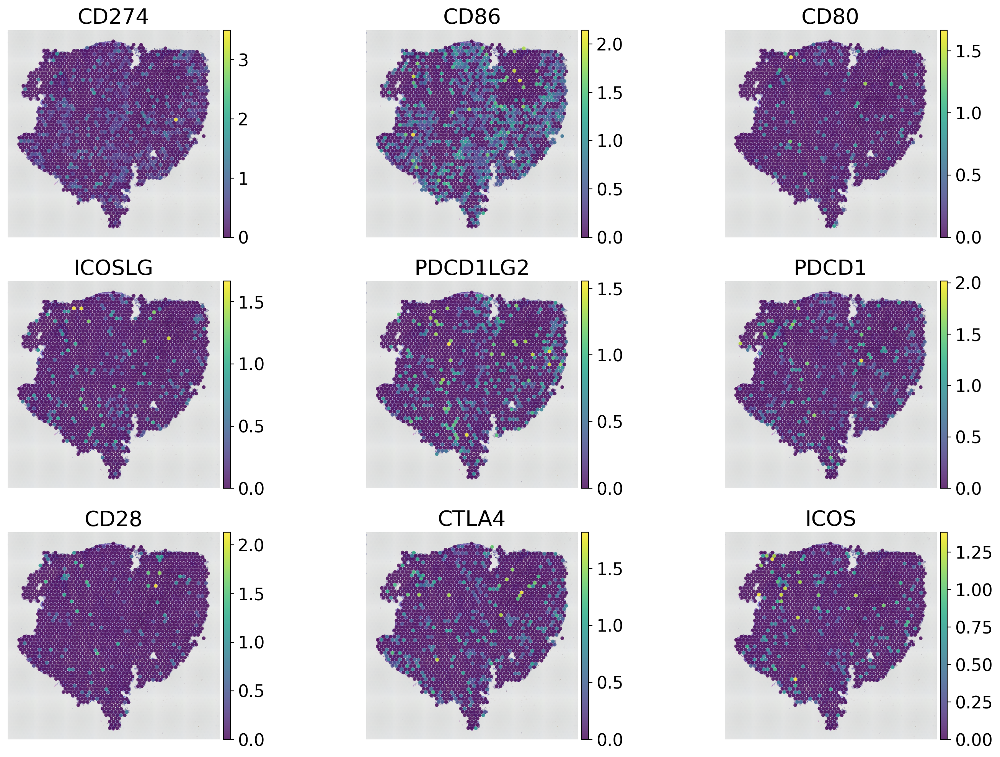

In [34]:
import matplotlib.pyplot as plt

testcells = ['CD274','CD86','CD80','ICOSLG','PDCD1LG2','PDCD1','CD28','CTLA4','ICOS']

plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams["figure.figsize"] = (15,10)
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams["legend.framealpha"] = 0.2

fig, axs = plt.subplots(3, 3, sharey=True, tight_layout=True)
    
for visnum in range(len(testcells)):
    sc.pl.spatial(spatial_final_mod, img_key='hires', color=testcells[visnum], vmin=0,
                  palette='Set1', size=1.5, alpha = 0.8, alpha_img = 1,
                  ax = axs[visnum//3][visnum%3], show = False)
    axs[visnum//3][visnum%3].set_title(testcells[visnum], fontsize=20)
    axs[visnum//3][visnum%3].axis('off')
plt.show()

#### Visualize colocalized regions of LR pairs

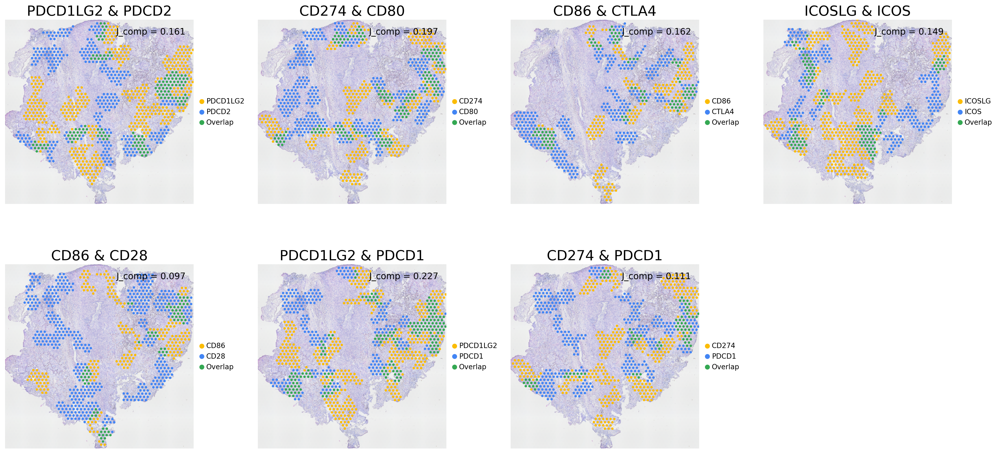

In [35]:
f, ax = plt.subplots(2, 4, figsize=(20, 10), sharey=False, tight_layout=True)
for index, (feat_x, feat_y) in enumerate(feat_pairs[:8]):
    spatial_final_mod.vis_all_connected(spot_size=1, 
                                        alpha_img=0.6, alpha=1,  
                                        feat_name_x=feat_x, feat_name_y=feat_y,
                                        fig_size=(5,5),
                                        adjust_image=True, border = 50,  
                                        title_fontsize=20, title = '', 
                                        return_axis=False, 
                                        axis=ax[index//4][index%4],
                                        save=False)
ax[1][3].axis('off')
plt.show()

#### Visualize top 8 regions with high local overlap (CD274 - PDCD1)

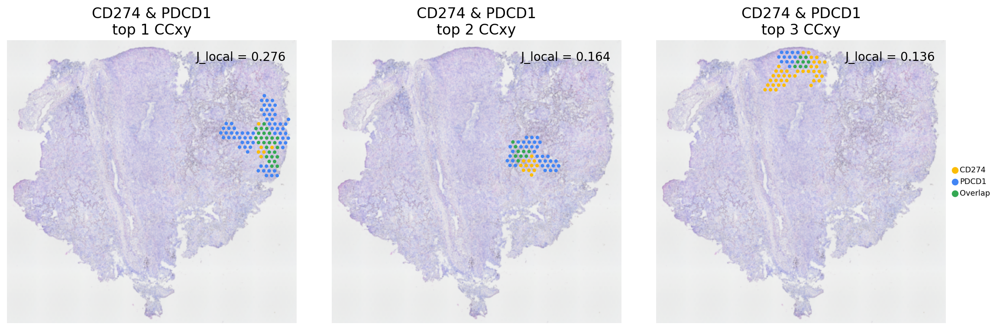

In [36]:
spatial_final_mod.vis_jaccard_top_n_pair(spot_size=1, alpha_img=0.6, alpha=1,  
                                         feat_name_x='CD274', feat_name_y='PDCD1',
                                         top_n = 3, ncol = 3,
                                         fig_size=(5,5), 
                                         batch_colname ='batch', batch_name='0', image_res='lowres',  
                                         adjust_image=True, border = 500,  
                                         title_fontsize=15, legend_fontsize=8, title = '', 
                                         return_axis=False, save=True, dpi=200)

### 3. Estimate cell type-specific colocalized regions btw LR pairs

#### Intersection between colocalized domain of tS2-Cytotoxic CD8 T & LR pairs

In [37]:
spatial_final_celltype = STopover_visium(sp_load_path=os.path.join(out_dir,'sp_visium_celltype_adata.h5ad'),
                                         lognorm=False, save_path=out_dir)
spatial_final_mod = STopover_visium(sp_load_path=os.path.join(out_dir,'lr_pair_cc_adata.h5ad'),
                                    lognorm=False, save_path=out_dir)
df_over = (spatial_final_celltype.obs['Comb_CC_tS2'] != 0) * (spatial_final_celltype.obs['Comb_CC_Cytotoxic CD8+ T'] != 0)
spatial_final_mod.obs['tS2_T'] = df_over.astype('category')
spatial_final_mod_over = spatial_final_mod[spatial_final_mod.obs['tS2_T'] != 0].copy()

adata_ts2_T = STopover_visium(sp_adata = spatial_final_mod_over, lognorm=False, save_path=out_dir)

Anndata object is not provided: searching for the .h5ad file in 'sp_load_path'
Anndata object is not provided: searching for the .h5ad file in 'sp_load_path'


#### Visualize colocalized regions of a tS2-CD8 T-specific LR

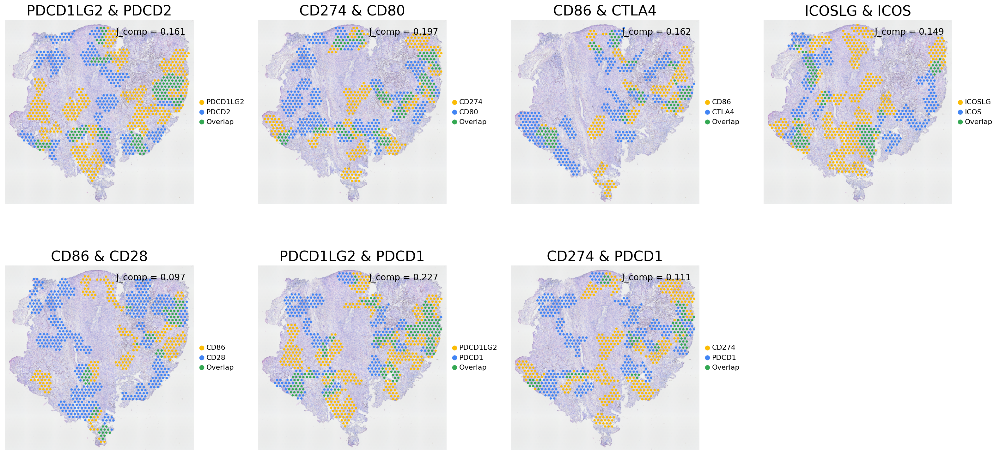

In [38]:
f, ax = plt.subplots(2, 4, figsize=(20, 10), sharey=False, tight_layout=True)
for index, (feat_x, feat_y) in enumerate(feat_pairs[:8]):
    adata_ts2_T.vis_all_connected(spot_size=1, 
                                  alpha_img=0.6, alpha=1,  
                                  feat_name_x=feat_x, feat_name_y=feat_y,
                                  fig_size=(5,5), image_res='hires',
                                  adjust_image=True, border = 500,  
                                  title_fontsize=20, title = '', 
                                  return_axis=False, 
                                  axis=ax[index//4][index%4],
                                  save=False)
ax[1][3].axis('off')
plt.show()

#### Run permutation test

In [12]:
df_feat_pairs = pd.DataFrame(feat_pairs)
df_feat_pairs

,0,1
0,PDCD1LG2,PDCD2
1,CD274,CD80
2,CD86,CTLA4
3,ICOSLG,ICOS
4,CD86,CD28
5,PDCD1LG2,PDCD1
6,CD274,PDCD1


In [13]:
spatial_final_mod.run_significance_test(feat_pairs_sig_test = df_feat_pairs,
                                        nperm=1000, seed=1234, jaccard_type='default', progress_bar=True)

Run permutation test for the given LR pairs
End of data preparation
Elapsed time: 0.80 seconds 
Calculation of adjacency matrix for visium


  0%|          | 0/1 [00:00<?, ?it/s]

Calculation of connected components for each feature


  0%|          | 0/10000 [00:00<?, ?it/s]

Calculation of composite jaccard indexes between feature pairs


  0%|          | 0/7000 [00:00<?, ?it/s]

End of the whole process: 1115.12 seconds


#### Filter out only significant colocalization

In [17]:
spatial_final_mod.uns.keys()

dict_keys(['J_result_0_sig', 'J_result_1', 'cc_loc_J_result_0_perm', 'fwhm', 'log1p', 'min_size', 'obs_raw', 'spatial', 'thres_per', 'cc_loc_J_result_1_perm', 'J_result_1_sig'])

In [18]:
df_perm = spatial_final_mod.uns['J_result_1_sig']
df_perm

,group,Feat_1,Feat_2,Avg_1,Avg_2,J_comp,p_value
0,0,PDCD1LG2,PDCD2,0.176012,0.336123,0.161400,0.484
1,0,CD274,CD80,0.248671,0.058966,0.196517,0.226
2,0,CD86,CTLA4,0.402514,0.155583,0.162479,0.472
3,0,ICOSLG,ICOS,0.084996,0.080510,0.148564,0.679
4,0,CD86,CD28,0.402514,0.070086,0.097063,0.919
5,0,PDCD1LG2,PDCD1,0.176012,0.141333,0.227217,0.040
6,0,CD274,PDCD1,0.248671,0.141333,0.110687,0.901


#### Save STopover object to the save_dir

In [19]:
spatial_final_mod.save_connected_loc_data(save_format='h5ad', filename = 'lr_pair_cc')